# Simulating lattice models of surface growth

In this project, we want to simulate models of surface growth defined on a 1D lattice of size L (lattice spacing is 1). One particle is dropped every $\Delta t = 1$. Starting from an empty lattice, we want to know how the height of particles at each site evolve. But we can imagine multiple rules on how to choose where to add the particle. Here we will simulate two of those models defined by the following set of rules :

### A) Random Deposition with Relaxation (RDR)



*   Drop a particle on a random site
*   If one of the neighbouring sites is lower, move to the lower site
*   If both neighbours are lower :
     - Go to the lowest
     - If they are both at the same height, choose one of the two with probability 1/2





### B) Solid on Solid (SOS)


*   Drop a particle on a random site
*   If the height difference with its neighbours is greater than 1, remove it



# Models simulation with python


## Model class definition

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython import get_ipython
from IPython.display import HTML
from scipy.optimize import curve_fit


plt.style.use('default')

%matplotlib inline

plt.rcParams.update({
    'font.size': 20,            # General font size
    'axes.titlesize': 22,       # Title font size
    'axes.labelsize': 20,       # Axis label font size
    'xtick.labelsize': 18,      # X-tick label font size
    'ytick.labelsize': 18,      # Y-tick label font size
    'legend.fontsize': 16,      # Legend font size
    'figure.figsize': (10, 6),  # Set default figure size
    'legend.frameon': True,
    'legend.edgecolor' : '0.1',
})

In [3]:
class lattice:
    def __init__(self, L):
        self.L = L
        self.h = np.zeros(L, dtype=int)
        self.t = 0

    def plot(self):
        plt.figure(figsize=(10,2))
        plt.grid()
        plt.xlim(0, L)
        plt.ylim(-30, 30)
        plt.title("Height of the interface at time t = %1.e" % (self.t/self.L))
        plt.step(range(self.L), self.h-np.mean(self.h), where='post')
        plt.xticks(np.arange(0,L+1, step = L/10))
        plt.show()


class RDR(lattice):
    def __init__(self, L):
        super().__init__(L)

    def step(self):
        self.t += 1
        i = np.random.randint(0, self.L)
        local_height = np.array([self.h[(i-1)%self.L], self.h[i], self.h[(i+1)%self.L]])
        if local_height[1] <= local_height[0] and local_height[1] <= local_height[2]:
            self.h[i] += 1

        elif local_height[0] < local_height[2]:
            self.h[(i-1)%self.L] += 1

        elif local_height[2] < local_height[0]:
            self.h[(i+1)%self.L] += 1

        else:
            if np.random.rand() < 0.5:
                self.h[(i-1)%self.L] += 1
            else:
                self.h[(i+1)%self.L] += 1



class SOS(lattice):
    def __init__(self, L):
        super().__init__(L)

    def step(self):
        self.t += 1

        i = np.random.randint(0, self.L)
        if abs(self.h[i] + 1 - self.h[(i-1)%self.L]) <= 1 and abs(self.h[(i+1)%self.L] - self.h[i] - 1) <= 1:
            self.h[i] += 1





## Verifications and Animations

In [ ]:
L = 100

test = RDR(L)
width = []

fig, ax = plt.subplots(figsize=(12,6))
ax.title.set_text("Random Deposition with Relaxation simulation")
ax.set_ylim(0,L+10)
# ax.set_ylim(-10, 10)
ax.set_xlim(0, L)
line, = ax.step([], [], lw=2, label = '$t = %i' % test.t)
legend = ax.legend()

def init():
    line.set_data([], [])
    return line,

def animate(i):
    # line.set_data(range(L), test.h-np.mean(test.h)
    line.set_data(range(L), test.h)
    legend.texts[0].set_text('$t = %i$' %(test.t/test.L))
    width.append(np.std(test.h))
    for i in range(100):
        test.step()
    return line,

animation = FuncAnimation(fig, animate, frames=98, interval=50, blit=True)
HTML(animation.to_jshtml())

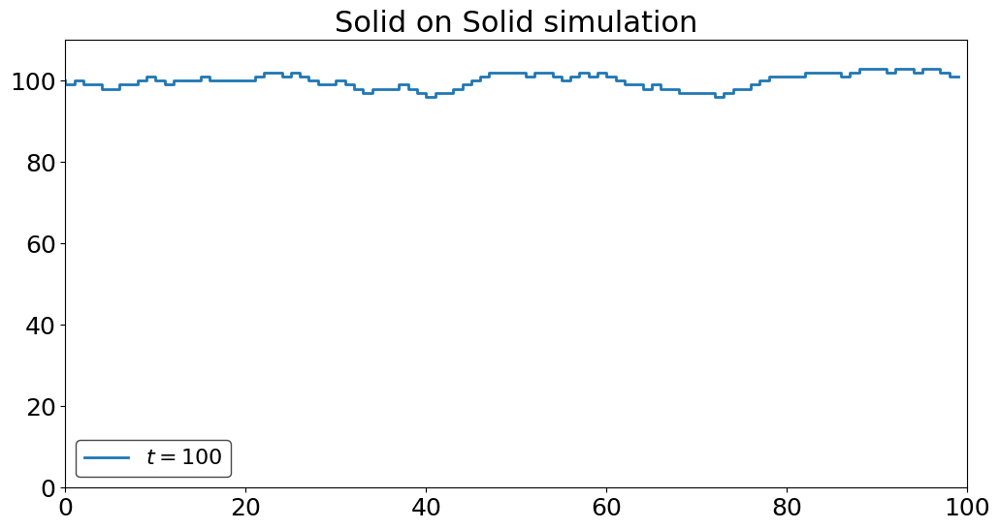

In [ ]:
L = 100

test = SOS(L)
width = []

fig, ax = plt.subplots(figsize=(12,6))
# adding a title to the plot
ax.title.set_text("Solid on Solid simulation")
ax.set_ylim(0,L+10)
# ax.set_ylim(-10, 10)
ax.set_xlim(0, L)
line, = ax.step([], [], lw=2, label = '$t = %i' % test.t)
legend = ax.legend()

def init():
    line.set_data([], [])
    return line,

def animate(i):
    # line.set_data(range(L), test.h-np.mean(test.h)
    line.set_data(range(L), test.h)
    legend.texts[0].set_text('$t = %i$' %(test.t/test.L))
    width.append(np.std(test.h))
    for i in range(100):
        test.step()
    return line,

animation = FuncAnimation(fig, animate, frames=98, interval=50, blit=True)
HTML(animation.to_jshtml())

In [ ]:
L = 1000

test = SOS(L)
for i in range(1000*L):
    test.step()

width = []

fig, ax = plt.subplots(figsize=(12,6))
# adding a title to the plot
ax.title.set_text("Solid on Solid simulation")
ax.set_ylim(-20, 20)
ax.set_xlim(0, L)
line, = ax.step([], [], lw=2, label = '$t = %i' % test.t)
legend = ax.legend()

def init():
    line.set_data([], [])
    return line,

def animate(i):
    line.set_data(range(L), test.h-np.mean(test.h))
    legend.texts[0].set_text('$t = %i$' %(test.t/test.L))
    width.append(np.std(test.h))
    for i in range(500):
        test.step()
    return line,

animation = FuncAnimation(fig, animate, frames=98, interval=50, blit=True)
HTML(animation.to_jshtml())

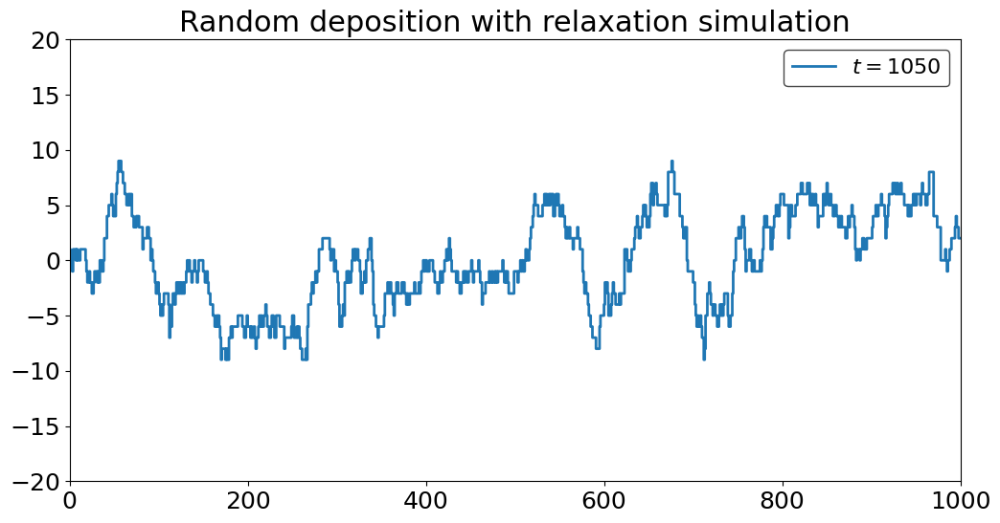

In [ ]:
L = 1000

test = RDR(L)
for i in range(1000*L):
    test.step()

width = []

fig, ax = plt.subplots(figsize=(12,6))
# adding a title to the plot
ax.title.set_text("Random deposition with relaxation simulation")
ax.set_ylim(-20, 20)
ax.set_xlim(0, L)
line, = ax.step([], [], lw=2, label = '$t = %i' % test.t)
legend = ax.legend()

def init():
    line.set_data([], [])
    return line,

def animate(i):
    line.set_data(range(L), test.h-np.mean(test.h))
    legend.texts[0].set_text('$t = %i$' %(test.t/test.L))
    width.append(np.std(test.h))
    for i in range(500):
        test.step()
    return line,

animation = FuncAnimation(fig, animate, frames=98, interval=50, blit=True)
HTML(animation.to_jshtml())

# Models simulation with c++


In order to gain efficiency, I decided to use c++. It is faster than python of approx. 2 orders of magnitude (i.e. it is about 100 times faster)

In [ ]:
%%writefile RDR.cpp
#include <iostream>
#include <fstream>
#include <vector>
#include <cstdlib>
#include <algorithm>
#include <ctime>
#include <cmath>

using namespace std;

class Lattice {
public:
    int L;
    vector<int> h;
    long t;

    Lattice(int L_val) : L(L_val), h(L_val, 0), t(0) {}

    double variance() {
        double mean = 0.0;
        for (int i = 0; i < L; i++) {
            mean += h[i];
        }
        mean /= L;

        double var = 0.0;
        for (int i = 0; i < L; i++) {
            var += (h[i] - mean) * (h[i] - mean);
        }
        return var / L;
    }

};

class RDR : public Lattice {
public:
    RDR(int L) : Lattice(L), left(L), right(L) {

    for (int i = 0; i < L; i++) {
            left[i] = (i - 1 + L) % L;
    }

    for (int i = 0; i < L; i++) {
            right[i] = (i + 1) % L;
    }

    };

    vector<int> left;
    vector<int> right;

    void step() {
        t++;

        int i = rand() % L;

        if (h[i] <= h[left[i]] && h[i] <= h[right[i]]) {
            h[i]++;
        }

        else if (h[left[i]] < h[right[i]]) {
            h[left[i]]++;
        }

        else if (h[right[i]] < h[left[i]]) {
            h[right[i]]++;
        }

        else if (h[left[i]] == h[right[i]]) {
            if (rand() % 2 == 0) {
                h[left[i]]++;
            }
            else {
                h[right[i]]++;
            }
    }

};

};

class SOS : public Lattice {
public:
    SOS(int L) : Lattice(L) {}

    void step() {
        t++;

        int i = rand() % L;

        int left   = h[(i - 1 + L) % L];
        int center = h[i] + 1; // height after addition
        int right  = h[(i + 1) % L];

        if (abs(center - left) <= 1 && abs(right - center) <= 1) {
            h[i]++;
            }
        }

};





int Simu_RDR(int L) {

    int steps = 10000;  // nombre de pas de la simulation
    int N = 100;       // nombre de simulations

    double W[steps];

    for (int i=0; i < steps; i++) {
            W[i] = 0;
        }

    for (int n = 0; n < N; n++) {

    if (n % 10 == 0) {
      cout << "Simulation " << n << "/" << N << endl;
    }

    srand(time(0)+n*n);

    RDR simulation(L);

    // Boucle de simulation
      for (int s = 0; s < steps*L; s++) {
          simulation.step();

          if (simulation.t % L == 0) {
              W[s/L] += simulation.variance();
          }
        }

    }

    cout << "Ecriture des données dans un fichier..." << endl;

    // Ouverture d'un fichier en écriture
    ofstream outfile("RDR_L_" + to_string(L) + ".txt");

    // Vérification de l'ouverture du fichier
    if (!outfile) {
        cerr << "Erreur lors de l'ouverture du fichier." << endl;
        return 1;
    }

    // Écriture des données dans le fichier
    for (int s = 0; s < steps; s++) {
        outfile << s << " " << (W[s]/N) << endl;
    }

    // Fermeture du fichier
    outfile.close();

    cout << "Données écrites dans le fichier RDR_L_" + to_string(L) + ".txt" << endl;

    return 0;
}




int Simu_SOS(int L) {

    int steps = 10000;  // nombre de pas de la simulation
    int N = 100;       // nombre de simulations

    double W[steps];

    for (int i=0; i < steps; i++) {
            W[i] = 0;
        }

    for (int n = 0; n < N; n++) {

    if (n % 10 == 0) {
        cout << "Simulation " << n << "/" << N << endl;
      }
    srand(time(0)+n*n);

    SOS simulation(L);


      for (int s = 0; s < steps*L; s++) {
          simulation.step();

          if (simulation.t % L == 0) {
              W[s/L] += simulation.variance();
          }
        }

    }


    cout << "Ecriture des données dans un fichier..." << endl;

    // Ouverture d'un fichier en écriture
    ofstream outfile("SOS_L_" + to_string(L) + ".txt");

    // Vérification de l'ouverture du fichier
    if (!outfile) {
        cerr << "Erreur lors de l'ouverture du fichier." << endl;
        return 1;
    }

    // Écriture des données dans le fichier
    for (int s = 0; s < steps; s++) {
        outfile << s << " " << (W[s]/N) << endl;
    }

    // Fermeture du fichier
    outfile.close();

    cout << "Données écrites dans le fichier SOS_L_" + to_string(L) + ".txt" << endl;

    return 0;

}


int main() {

    Simu_SOS(100);
    Simu_SOS(200);
    Simu_SOS(300);
    Simu_SOS(400);
    Simu_SOS(500);


    return 0;
}



In [26]:
! g++ RDR.cpp -o RDR_program

In [ ]:
! ./RDR_program

# Questions

## 1) Measure of $W(L, t)$, fit of $\alpha$ and $z$, Family-Vicsek scaling

For both models, in the short time regime, the interface growth is independant of the system size and grows as a power law. Then for large times $t \gg t_c \sim L^z$ the interface reaches a stationary distribution of width $W \sim L^{\alpha}$. In order to extract the values of these exponents, I plotted $\log (W(L, t))$ as a function of time, for different values of $L$, then I fitted these curves with the following function :

$$ f(x) = \begin{cases} ax+b \qquad \text{if} \quad x < x_c \\
ax_c + b \qquad \text{else} \quad
\end{cases}$$

where $a$, $b$ and $x_c$ are the parameters to fit. From this we can extract the value of the critical time and the value of the stationary width, for each $L$. Then, plotting them as a function of $L$, should give respectively the values of $z$ and $\alpha$, as they will be the slopes of the curves.

The advantage of this method, is that you don't have to choose by eye when the small time regime stops and when the large time one starts. Moreover, since we will fit the data in a log-log scale, initially equidistant points will accumulate towards the large values of $\log(t)$. Thus, the fit will tend to minimize the cost function by focusing on the large times, and will not pay attention to the first few hundred points (which are the most important). Thus, I chose to sample logarithmically spaced data points, to help the fitting process.

Finally, to check the Family-Vicsek scaling, I plotted $W/L^{\alpha_{fit}}$ as a function of $t/L^{z_{fit}}$ for different values of $L$, where $\alpha_{fit}$ and $ z_{fit}$ are the fitted values of $\alpha$ and $z$ found before. By doing so, all the plots should overlap, to give the function of the Family-Vicsek scaling.

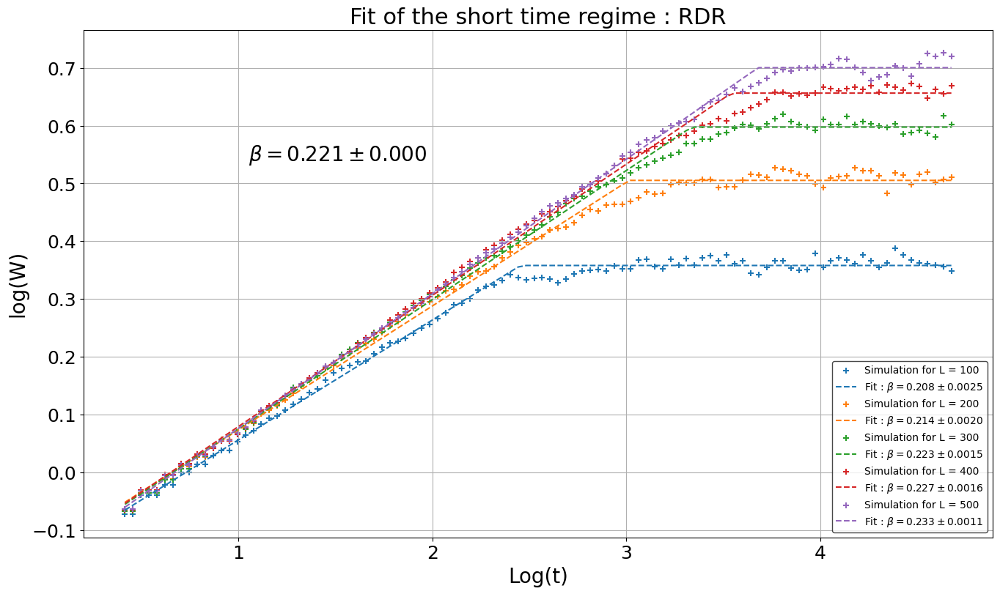

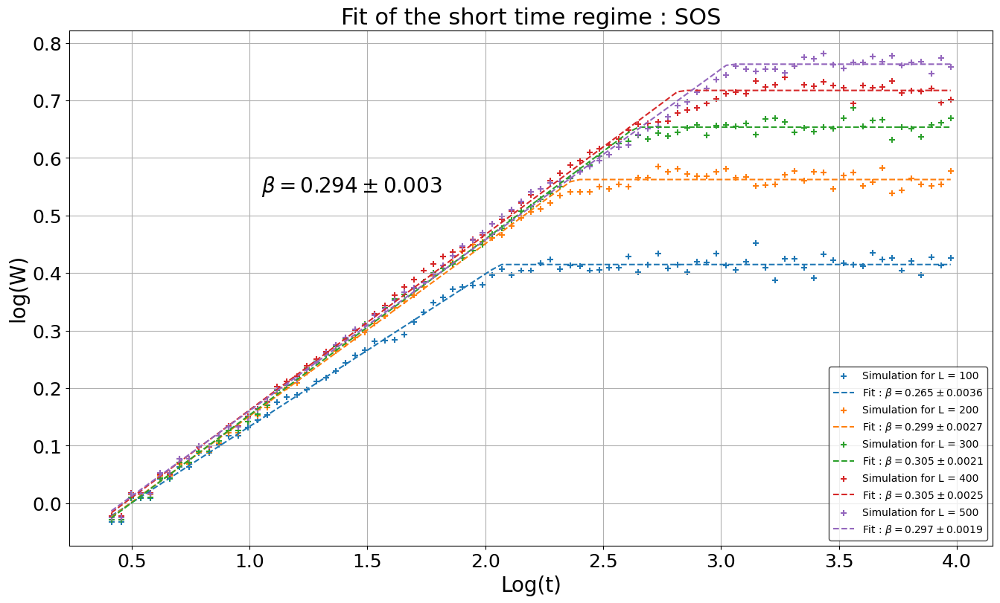

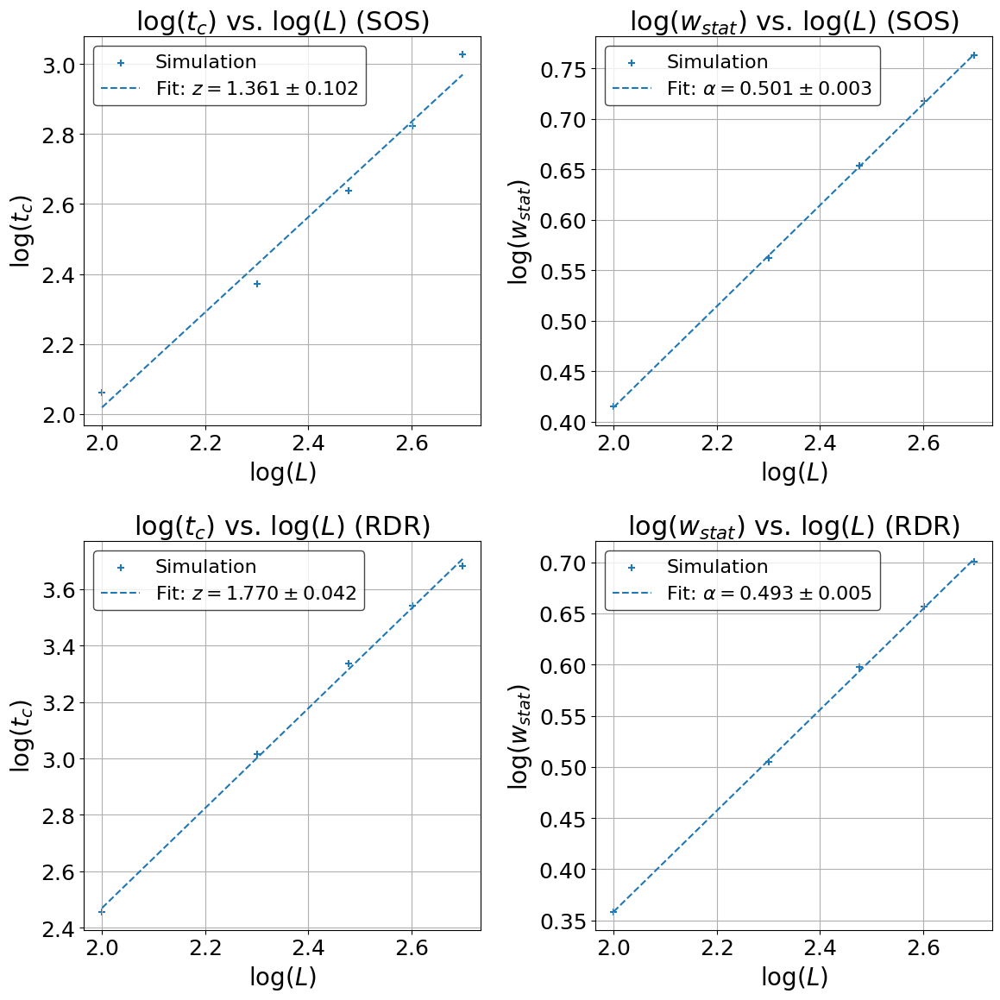

In [28]:
def two_slopes(X, a, b, x_c): # Function to fit : affine function then flat after x_c
  k = b + x_c*a
  Y = []
  for x in X:
    if x < x_c:
        Y.append(a*x + b)
    else:
        Y.append(k)
  return np.array(Y)

def affine(X, a, b):
  Y = []
  for x in X:
    Y.append(a*x + b)
  return np.array(Y)

def file_plot(L, simu): # Function to read the text files
    time = []
    variance = []
    with open(simu + "_L_" + str(L) + ".txt", 'r') as file:
        for line in file:
            t, v = map(float, line.split())
            # Ignore errors in the file
            if v < 0:
                v = min(variance)
            if np.isnan(v):
                v = min(variance)

            time.append(t)
            variance.append(v)
    time = np.array(time)
    width = np.sqrt(np.array(variance)) # Width : sqrt of the variance, after averaging over realisations

    t = []
    W = []
    s = 1
    while s < time[-1]: # storing data logarithmically spaced in order to no bias the fit
        t.append(s)
        W.append(width[int(s)])
        s *= 1.1

    return np.array(t), np.array(W)


def file_fit(L, simu): # function to fit the data

    # Reading the files
    t, W = file_plot(L, simu)

    # Ignoring the first few points
    t = t[10:]
    W = W[10:]
    sigma_w = np.ones(len(W))

    popt, pcov = curve_fit(two_slopes, np.log10(t), np.log10(W), p0=[0.25, 0, 3], sigma=sigma_w)

    # Fit error on beta
    sigma_beta = np.sqrt(pcov[0][0])


    plt.scatter(np.log10(t), np.log10(W), marker = "+", label = "Simulation for L = "  + str(L))
    plt.plot(np.log10(t), two_slopes(np.log10(t), *popt), '--', label = r"Fit : $\beta = %1.3f \pm %1.4f$" %(popt[0], sigma_beta))
    plt.xlabel("Log(t)")
    plt.ylabel("log(W)")
    plt.title("Fit of the short time regime : " + simu)
    plt.grid(True)
    plt.legend(fontsize = 10, loc = "lower right")

    beta = popt[0]
    log_t_c = popt[2]
    log_w_stat = popt[1] + log_t_c * beta
    sigma_beta = np.sqrt(pcov[0][0])

    return beta, log_t_c, log_w_stat, sigma_beta

# different lenghts
L = np.array([100, 200, 300, 400, 500])



# RDR case :

beta_RDR = []
sigma_beta_RDR = []
log_t_c_RDR = []
log_w_stat_RDR = []

plt.figure(figsize=(16, 9))

for l in L:
    fit = file_fit(l, "RDR")
    beta_RDR.append(fit[0])
    log_t_c_RDR.append(fit[1])
    log_w_stat_RDR.append(fit[2])
    sigma_beta_RDR.append(0)

beta_avg = np.mean(np.array(beta_RDR))
sigma_beta = np.mean(np.array(sigma_beta_RDR))
plt.text(1.05, 0.54, r"$\beta = %1.3f \pm %.3f$" %(beta_avg, sigma_beta), fontsize = 20)

plt.show()



# SOS case :

beta_SOS = []
sigma_beta_SOS = []
log_t_c_SOS = []
log_w_stat_SOS = []

plt.figure(figsize=(16, 9))

for l in L:
    fit = file_fit(l, "SOS")
    beta_SOS.append(fit[0])
    log_t_c_SOS.append(fit[1])
    log_w_stat_SOS.append(fit[2])
    sigma_beta_SOS.append(fit[3])

beta_avg = np.mean(np.array(beta_SOS))
sigma_beta = np.mean(np.array(sigma_beta_SOS))
plt.text(1.05, 0.54, r"$\beta = %1.3f \pm %.3f$" %(beta_avg, sigma_beta), fontsize = 20)

plt.show()


# Fit of z and alpha

fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# SOS
# z fit for SOS
z_sos, pcov_z_sos = curve_fit(affine, np.log10(L), log_t_c_SOS, p0=[2, 0])
sigma_z_sos = np.sqrt(pcov_z_sos[0][0])
axs[0, 0].scatter(np.log10(L), log_t_c_SOS, marker="+", label="Simulation")
axs[0, 0].plot(np.log10(L), affine(np.log10(L), *z_sos), '--',
              label=r"Fit: $z = %1.3f \pm %1.3f$" % (z_sos[0], sigma_z_sos))
axs[0, 0].set_title(r"$\log(t_c)$ vs. $\log(L)$ (SOS)")
axs[0, 0].set_xlabel(r"$\log(L)$")
axs[0, 0].set_ylabel(r"$\log(t_c)$")
axs[0, 0].legend()
axs[0, 0].grid()

# alpha fit for SOS
alpha_sos, pcov_alpha_sos = curve_fit(affine, np.log10(L), log_w_stat_SOS, p0=[0.5, 0])
sigma_alpha_sos = np.sqrt(pcov_alpha_sos[0][0])
axs[0, 1].scatter(np.log10(L), log_w_stat_SOS, marker="+", label="Simulation")
axs[0, 1].plot(np.log10(L), affine(np.log10(L), *alpha_sos), '--',
              label=r"Fit: $\alpha = %1.3f \pm %1.3f$" % (alpha_sos[0], sigma_alpha_sos))
axs[0, 1].set_title(r"$\log(w_{stat})$ vs. $\log(L)$ (SOS)")
axs[0, 1].set_xlabel(r"$\log(L)$")
axs[0, 1].set_ylabel(r"$\log(w_{stat})$")
axs[0, 1].legend()
axs[0, 1].grid()

# RDR
# z fit for RDR
z_rdr, pcov_z_rdr = curve_fit(affine, np.log10(L), log_t_c_RDR, p0=[2, 0])
sigma_z_rdr = np.sqrt(pcov_z_rdr[0][0])
axs[1, 0].scatter(np.log10(L), log_t_c_RDR, marker="+", label="Simulation")
axs[1, 0].plot(np.log10(L), affine(np.log10(L), *z_rdr), '--',
              label=r"Fit: $z = %1.3f \pm %1.3f$" % (z_rdr[0], sigma_z_rdr))
axs[1, 0].set_title(r"$\log(t_c)$ vs. $\log(L)$ (RDR)")
axs[1, 0].set_xlabel(r"$\log(L)$")
axs[1, 0].set_ylabel(r"$\log(t_c)$")
axs[1, 0].legend()
axs[1, 0].grid()

# alpha fit for RDR

alpha_rdr, pcov_alpha_rdr = curve_fit(affine, np.log10(L), log_w_stat_RDR, p0=[0.5, 0])
sigma_alpha_rdr = np.sqrt(pcov_alpha_rdr[0][0])
axs[1, 1].scatter(np.log10(L), log_w_stat_RDR, marker="+", label="Simulation")
axs[1, 1].plot(np.log10(L), affine(np.log10(L), *alpha_rdr), '--',
              label=r"Fit: $\alpha = %1.3f \pm %1.3f$" % (alpha_rdr[0], sigma_alpha_rdr))
axs[1, 1].set_title(r"$\log(w_{stat})$ vs. $\log(L)$ (RDR)")
axs[1, 1].set_xlabel(r"$\log(L)$")
axs[1, 1].set_ylabel(r"$\log(w_{stat})$")
axs[1, 1].legend()
axs[1, 1].grid()



plt.tight_layout()
plt.show()



In both cases, the $\alpha$ measurement gives $\approx 0.5$ with relatively little uncertainty. However, the measurement of $z$ is noisier but still gives significantly different values for the two models, which means that they do not belong to the same universality class. The fact that the measurement of $z$ is noisier is related to the method I chose to fit the critical time $t_c$. Just by looking at the data, it is not very clear where to place it exactly, as the transition from the power-law growth and the stationary regime is continuous. Moreover, this technique could include a systematic bias in the measurement of $z$, that would be hard to eliminate.

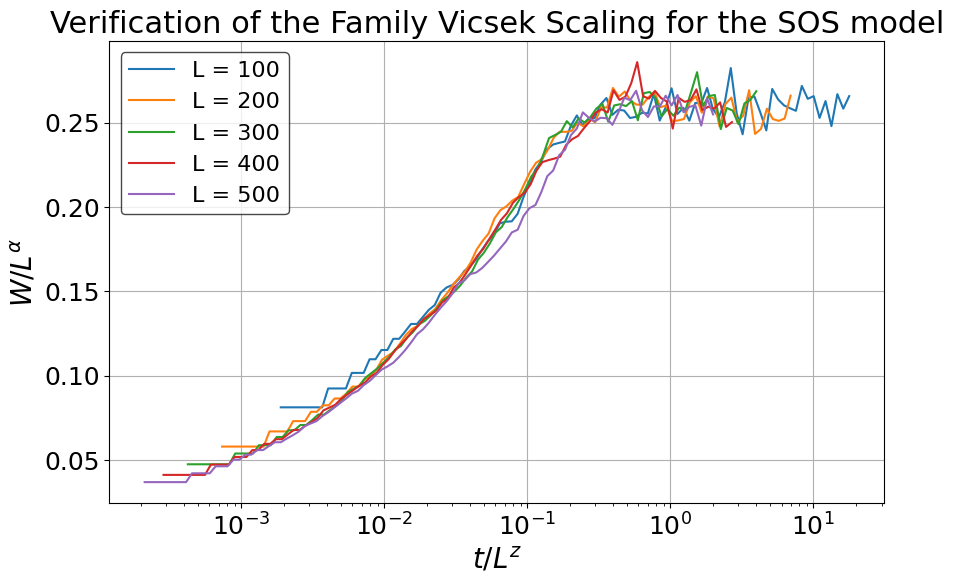

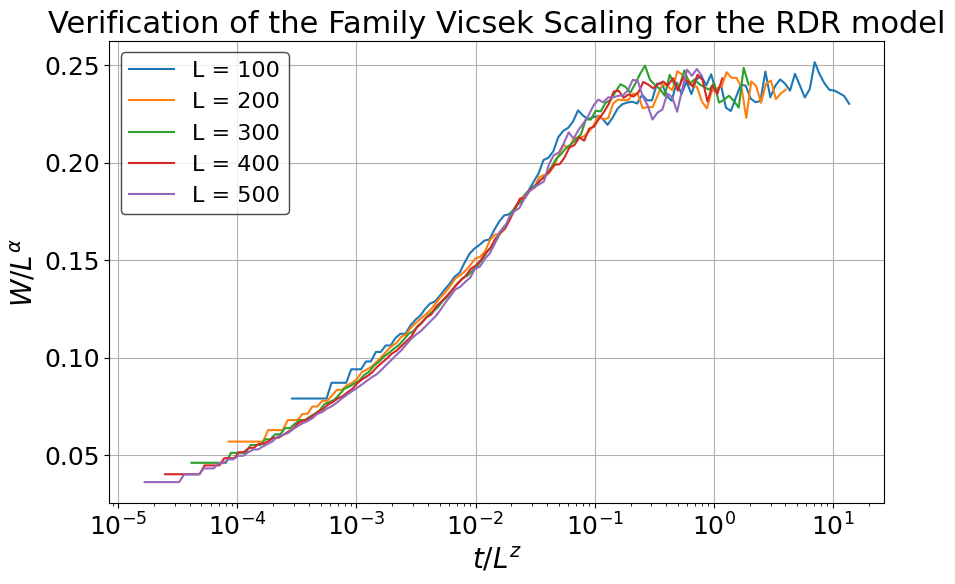

In [30]:
plt.figure()
plt.xlabel(r"$t/L^{z}$")
plt.ylabel(r"$W/L^{\alpha}$")
plt.xscale("log")
plt.grid()

for l in L:
    t, W = file_plot(l, "SOS")
    plt.plot(t/(l**(z_sos[0])), W/(l**(alpha_sos[0])), label = "L = " + str(l))
plt.legend()
plt.title("Verification of the Family Vicsek Scaling for the SOS model")
plt.show()


plt.figure()
plt.xlabel(r"$t/L^{z}$")
plt.ylabel(r"$W/L^{\alpha}$")
plt.xscale("log")
plt.grid()

for l in L:
    t, W = file_plot(l, "RDR")
    plt.plot(t/(l**(z_rdr[0])), W/(l**(alpha_rdr[0])), label = "L = " + str(l))

plt.legend()
plt.title("Verification of the Family Vicsek Scaling for the RDR model")
plt.show()

The family Vicsek scaling is indeed verified as all the plots overlap quite well, in both the SOS and RDR case.

## 2) Fit of $\beta$

We can extract the value of $\beta$ from the fit done previously, as it is simply the slope of the first line.

From this I sadly get weird results as I should have $ \beta = \alpha / z $, but here it differs significantly. Moreover, it seems that the simulations agree quite well for different values of $L$, which implies that this is not due to statistical bad luck.

In the SOS case, I find $\beta \approx 0.294$ while I should have $\beta \approx 0.37$.

In the RDR case, I find $\beta \approx 0.221$ while I should have $\beta \approx 0.28$.




## 3) Universalit class of the two models

From the fits, even if there is quite a lot of uncertainty on the value of $z$, it seems that the SOS model is close to $\alpha = 1/2$, $z = 3/2$, which is the KPZ universality class.

On the other hand, the RDR model seems to be closer to $\alpha = 1/2$, $z = 2$, which is the Edwards-WIlkinson universality class.

## 4) Heights histograms



RDR : Simulation 0/100
RDR : Simulation 10/100
RDR : Simulation 20/100
RDR : Simulation 30/100
RDR : Simulation 40/100
RDR : Simulation 50/100
RDR : Simulation 60/100
RDR : Simulation 70/100
RDR : Simulation 80/100
RDR : Simulation 90/100
SOS : Simulation 0/100
SOS : Simulation 10/100
SOS : Simulation 20/100
SOS : Simulation 30/100
SOS : Simulation 40/100
SOS : Simulation 50/100
SOS : Simulation 60/100
SOS : Simulation 70/100
SOS : Simulation 80/100
SOS : Simulation 90/100


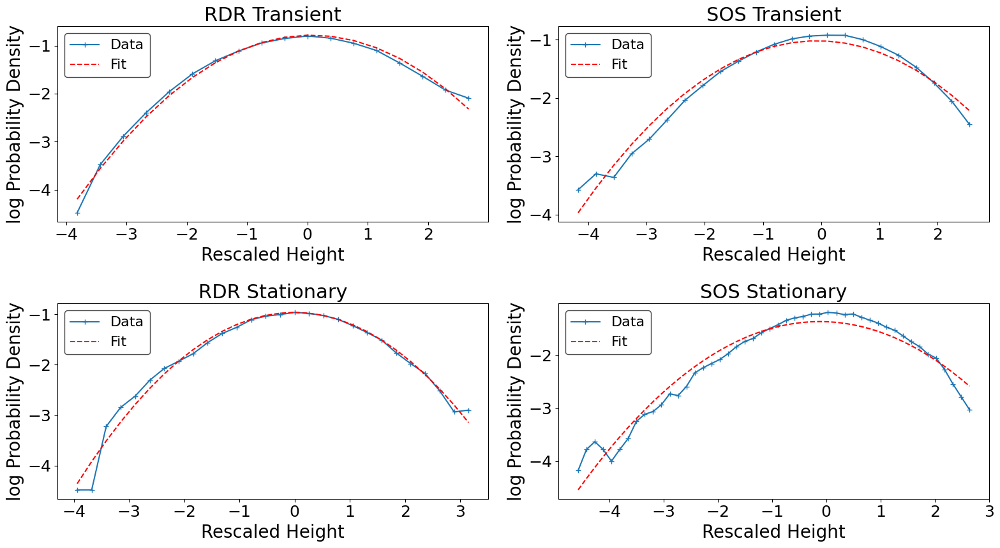

In [10]:
import numpy as np
import matplotlib.pyplot as plt


L = 300
steps_transient = 300  # Steps for transient regime
steps_stationary = 2000  # Steps for stationary regime
N = 100

rdr_transient_heights = []
rdr_stationary_heights = []
sos_transient_heights = []
sos_stationary_heights = []


# RDR Simulation
for n in range(N):
    if n % 10 == 0:
        print(f"RDR : Simulation {n}/{N}")
    simulation = RDR(L)
    for _ in range(steps_transient * L):
        simulation.step()
    rdr_transient_heights.extend(simulation.h.tolist())
    for _ in range(steps_stationary * L):
        simulation.step()
    rdr_stationary_heights.extend(simulation.h.tolist())

# SOS Simulation
for n in range(N):
    if n % 10 == 0:
        print(f"SOS : Simulation {n}/{N}")
    simulation = SOS(L)
    for _ in range(steps_transient * L):
        simulation.step()
    sos_transient_heights.extend(simulation.h.tolist())
    for _ in range(steps_stationary * L):
        simulation.step()
    sos_stationary_heights.extend(simulation.h.tolist())


# To have no empty bins
bins_rdr_transient = range(min(rdr_transient_heights), max(rdr_transient_heights))
bins_rdr_stationary = range(min(rdr_stationary_heights), max(rdr_stationary_heights))
bins_sos_transient = range(min(sos_transient_heights), max(sos_transient_heights))
bins_sos_stationary = range(min(sos_stationary_heights), max(sos_stationary_heights))

hist_rdr_transient, _ = np.histogram(rdr_transient_heights, bins=bins_rdr_transient, density=True)
hist_rdr_stationary, _ = np.histogram(rdr_stationary_heights, bins=bins_rdr_stationary, density=True)
hist_sos_transient, _ = np.histogram(sos_transient_heights, bins=bins_sos_transient, density=True)
hist_sos_stationary, _ = np.histogram(sos_stationary_heights, bins=bins_sos_stationary, density=True)

bins_rdr_transient = np.array(bins_rdr_transient)
bins_rdr_stationary = np.array(bins_rdr_stationary)
bins_sos_transient = np.array(bins_sos_transient)
bins_sos_stationary = np.array(bins_sos_stationary)

bins_rdr_transient = (bins_rdr_transient - np.mean(rdr_transient_heights))/np.std(rdr_transient_heights)
bins_rdr_stationary = (bins_rdr_stationary - np.mean(rdr_stationary_heights))/np.std(rdr_stationary_heights)
bins_sos_transient = (bins_sos_transient - np.mean(sos_transient_heights))/np.std(sos_transient_heights)
bins_sos_stationary = (bins_sos_stationary - np.mean(sos_stationary_heights))/np.std(sos_stationary_heights)


def gaussian_log(x, D, mu, E):
    return D - E * (x - mu)**2

fit_sos_transient, _ = curve_fit(gaussian_log, bins_sos_transient[:-1], np.log10(hist_sos_transient))
fit_sos_stationary, _ = curve_fit(gaussian_log, bins_sos_stationary[:-1], np.log10(hist_sos_stationary))
fit_rdr_transient, _ = curve_fit(gaussian_log, bins_rdr_transient[:-1], np.log10(hist_rdr_transient))
fit_rdr_stationary, _ = curve_fit(gaussian_log, bins_rdr_stationary[:-1], np.log10(hist_rdr_stationary))

fig, axs = plt.subplots(2, 2, figsize=(16, 9))

# RDR Transient
axs[0, 0].plot(bins_rdr_transient[:-1], np.log10(hist_rdr_transient), marker = "+", label='Data')
axs[0, 0].plot(bins_rdr_transient[:-1], gaussian_log(bins_rdr_transient[:-1], *fit_rdr_transient), "r--", label='Fit')
axs[0, 0].set_title('RDR Transient')
axs[0, 0].set_xlabel('Rescaled Height')
axs[0, 0].set_ylabel('log Probability Density')
axs[0, 0].legend()

# SOS transient
axs[0, 1].plot(bins_sos_transient[:-1], np.log10(hist_sos_transient), marker = "+", label='Data')
axs[0, 1].plot(bins_sos_transient[:-1], gaussian_log(bins_sos_transient[:-1], *fit_sos_transient), "r--", label='Fit')
axs[0, 1].set_title('SOS Transient')
axs[0, 1].set_xlabel('Rescaled Height')
axs[0, 1].set_ylabel('log Probability Density')
axs[0, 1].legend()

# RDR Stationary
axs[1, 0].plot(bins_rdr_stationary[:-1], np.log10(hist_rdr_stationary), marker = "+", label='Data')
axs[1, 0].plot(bins_rdr_stationary[:-1], gaussian_log(bins_rdr_stationary[:-1], *fit_rdr_stationary), "r--", label='Fit')
axs[1, 0].set_title('RDR Stationary')
axs[1, 0].set_xlabel('Rescaled Height')
axs[1, 0].set_ylabel('log Probability Density')
axs[1, 0].legend()

# SOS Stationary
axs[1, 1].plot(bins_sos_stationary[:-1], np.log10(hist_sos_stationary), marker = "+", label='Data')
axs[1, 1].plot(bins_sos_stationary[:-1], gaussian_log(bins_sos_stationary[:-1], *fit_sos_stationary), "r--", label='Fit')
axs[1, 1].set_title('SOS Stationary')
axs[1, 1].set_xlabel('Rescaled Height')
axs[1, 1].set_ylabel('log Probability Density')
axs[1, 1].legend()

plt.tight_layout()
plt.show()

In the RDR case, the gaussian fit works quite well, which is coherent with our previous result that RDR is in the EW class. However, the gaussian fit does not work well with the SOS case, which is again coherent with our previous result. Actually, the distribution of heights in the SOS case should be a Tracy-Widom distribution, with Dyson index $\beta = 1$ because we started from a flat interface.

Note however that these observations are valid in the bulk of the distribution, and that probably, there is non-universal tails to these distributions. They could be investigated for instance through importance sampling, which would put more emphasis on rare realisation of the interface height.

# Conclusion

In this project, we implemented two models of surface growth in order to find back the scaling laws found during the lectures. The Random Deposition with Relaxation model, was found to be in the Edwards-Wilkinson universality class, while the Solid On Solid model is in the KPZ one.

Nonetheless, more accuracy in the determination of $z$ is needed, which would probably be doable with another aproach than the one presented here. Moreover, the fit of the short time regime did not give convincing results, as there is a descrepeny between what is predicted and the numerical simulations. This is probably due to an error somewhere or maybe to a finite size effect.

We then investigated the Histograms of both models. While differences between the two regimes (transient and stationary) where not flagrant, we were able to observe that the fluctuations of the SOS interface are not gaussian, in contrary to the RDR model.

Finallay, we can note that despite the simplicity of the rules of both models, it was still able to exhibit quite complex behaviours, which is a wonderful result in my opinion.